# Reducing the number of high fatality accidents

## 🦺 Motivation
An enormous effort is being made here at the Department of Transport to gather, and make public, data on road safety. Our reporting team has a collection fo files on every accident that is reported in *Great Britain* since 1979. According to our official Open Data page:

> These files provide detailed road safety data about the circumstances of personal injury road accidents in GB from 1979, the types of vehicles involved and the consequential casualties. The statistics relate only to personal injury accidents on public roads that are reported to the police, and subsequently recorded, using the STATS19 accident reporting form.

In this report, we at the *Road Safety Team* analyze data from 2020 to learn more about major incidents and their characteristics. We classify **major incidents** as being **fatal accidents involving 3+ casualties**.

Throughout the presented analysis, we will get some numbers on the time of occurrence of major incidents, their frequency and distribution across this one year period. We finish the report with our recommendations and main insights from the analysis.

## 💾 The data
The reporting department have been collecting data on every accident that is reported. They've included this along with a lookup file for 2020's accidents.

*Published by the department for transport. https://data.gov.uk/dataset/road-accidents-safety-data* 
*Contains public sector information licensed under the Open Government Licence v3.0.*

Let's read our data and see the first 5 rows:

In [1]:
import pandas as pd
import plotly.express as px
accidents = pd.read_csv(r'./data/accident-data.csv')
accidents.head()

,accident_index,accident_year,accident_reference,longitude,latitude,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,...,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area
0,2020010219808,2020,10219808,-0.254001,51.462262,3,1,1,04/02/2020,3,...,6,0,9,9,1,9,9,0,0,1
1,2020010220496,2020,10220496,-0.139253,51.470327,3,1,2,27/04/2020,2,...,6,0,0,4,1,1,1,0,0,1
2,2020010228005,2020,10228005,-0.178719,51.529614,3,1,1,01/01/2020,4,...,6,0,0,0,4,1,2,0,0,1
3,2020010228006,2020,10228006,-0.001683,51.541210,2,1,1,01/01/2020,4,...,6,0,0,4,4,1,1,0,0,1
4,2020010228011,2020,10228011,-0.137592,51.515704,3,1,2,01/01/2020,4,...,5,0,0,0,4,1,1,0,0,1


The lookup file for our data is located in the same `data` folder and can be read using `pandas` as well:

In [2]:
lookup = pd.read_csv(r'./data/road-safety-lookups.csv')
lookup.head()

,table,field name,code/format,label,note
0,Accident,accident_index,NaN,NaN,unique value for each accident. The accident_i...
1,Accident,accident_year,NaN,NaN,NaN
2,Accident,accident_reference,NaN,NaN,In year id used by the police to reference a c...
3,Accident,longitude,NaN,NaN,Null if not known
4,Accident,Latitude,NaN,NaN,Null if not known


# 🔬 Data Integrity

Before starting the actual analysis, we will inspect our data to get some main statistics and find possible missing values.

As a first step lets create a helper function to get the information of a gicen table from the lookup file:

In [3]:
pd.set_option('display.max_colwidth', None)

# Create function to lookup specific column information
def lookup_item(feat):
    return lookup[lookup['field name'] == feat]

Using this function, we can call it giving a column name (from our `accidents` dataframe) and get the information from `lookup`:

In [4]:
lookup_item('accident_severity')

,table,field name,code/format,label,note
5,Accident,accident_severity,1,Fatal,NaN
6,Accident,accident_severity,2,Serious,NaN
7,Accident,accident_severity,3,Slight,NaN


To make sure we leave the original data unchanged, we make a copy of the `accidents` dataframe and call it `accidents_analysis`. This latter object will be used for our analysis and manipulations.

In [5]:
accidents_analysis = accidents.copy()

---
## Size of data and missing values

The data from 2020 accidents contains 91199 rows corresponding to 91199 unique accidents. This can be found with the `len()` function call on our dataframe:

In [6]:
len(accidents_analysis)

91199

### Information on data types and number of entries

The method `info()` is used here to get the number of non-null entries in each column of our dataframe and their corresponding data types:

In [7]:
accidents_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   accident_index                           91199 non-null  object 
 1   accident_year                            91199 non-null  int64  
 2   accident_reference                       91199 non-null  object 
 3   longitude                                91185 non-null  float64
 4   latitude                                 91185 non-null  float64
 5   accident_severity                        91199 non-null  int64  
 6   number_of_vehicles                       91199 non-null  int64  
 7   number_of_casualties                     91199 non-null  int64  
 8   date                                     91199 non-null  object 
 9   day_of_week                              91199 non-null  int64  
 10  time                                     91199

### Checking for null values

From the table above we see that `longitude` and `latitude` have some missing values. Let's get a better look at this by displaying the amount of missing data in each column:

In [8]:
accidents_analysis.isnull().sum()

accident_index                              0
accident_year                               0
accident_reference                          0
longitude                                  14
latitude                                   14
accident_severity                           0
number_of_vehicles                          0
number_of_casualties                        0
date                                        0
day_of_week                                 0
time                                        0
first_road_class                            0
first_road_number                           0
road_type                                   0
speed_limit                                 0
junction_detail                             0
junction_control                            0
second_road_class                           0
second_road_number                          0
pedestrian_crossing_human_control           0
pedestrian_crossing_physical_facilities     0
light_conditions                  

We have 14 data points (rows) with missing values for longitude and latitude, this corresponds to, approximately, 0.15% of our data. For this report, we judge it safe to remove this points and continue the analysis.

In [9]:
print('Percentage of data with null values:')
print( ( len(accidents_analysis[accidents_analysis['latitude'].isnull()])/ len(accidents_analysis) ) * 100 )

Percentage of data with null values:
0.015351045515849955


In [10]:
# Dropping the null values
accidents_analysis = accidents_analysis.dropna()

After droping the null values, we do a quick sanity check to see if any values are still missing:

In [11]:
# Check for null values:
accidents_analysis.isnull().sum()

accident_index                             0
accident_year                              0
accident_reference                         0
longitude                                  0
latitude                                   0
accident_severity                          0
number_of_vehicles                         0
number_of_casualties                       0
date                                       0
day_of_week                                0
time                                       0
first_road_class                           0
first_road_number                          0
road_type                                  0
speed_limit                                0
junction_detail                            0
junction_control                           0
second_road_class                          0
second_road_number                         0
pedestrian_crossing_human_control          0
pedestrian_crossing_physical_facilities    0
light_conditions                           0
weather_co

Now we are safe to engineer some useful new features in our data.

---
# 🧰 Feature engineering

## Date

Our dataframe has a column for `date` and `day_of_week`. We will create three new features based on these to get better numerical analysis down the road:
* accident_month: Month of accident.
* accident_day: Day of accident.
* accident_day_of_year: Day of year of accident (running from 1 to 365).

In [12]:
import datetime
# Create new columns: accident_month and accident_day

def convert_month(obj):
    dto = datetime.datetime.strptime(obj, '%d/%m/%Y')
    return dto.month

def convert_day(obj):
    dto = datetime.datetime.strptime(obj, '%d/%m/%Y')
    return dto.day

def convert_day_of_year(obj):
    dto = datetime.datetime.strptime(obj, '%d/%m/%Y')
    return dto.strftime('%j')

accidents_analysis['accident_month'] = accidents_analysis['date'].apply(convert_month)
accidents_analysis['accident_day'] = accidents_analysis['date'].apply(convert_day)
accidents_analysis['accident_day_of_year'] = accidents_analysis['date'].apply(convert_day_of_year)

In [13]:
accidents_analysis.head(3)

,accident_index,accident_year,accident_reference,longitude,latitude,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,accident_month,accident_day,accident_day_of_year
0,2020010219808,2020,10219808,-0.254001,51.462262,3,1,1,04/02/2020,3,...,9,1,9,9,0,0,1,2,4,035
1,2020010220496,2020,10220496,-0.139253,51.470327,3,1,2,27/04/2020,2,...,4,1,1,1,0,0,1,4,27,118
2,2020010228005,2020,10228005,-0.178719,51.529614,3,1,1,01/01/2020,4,...,0,4,1,2,0,0,1,1,1,001


With these new features, we can drop the `date` column as it became redundant.

In [14]:
# We can drop the date column
accidents_analysis = accidents_analysis.drop(['date'], axis = 1)

## Time

The `time` feature is in the format *HH:MM*. We'll extract only the information on the hour and create a new feature called `accident_hour`:

In [15]:
# Getting hour:
accidents_analysis['accident_hour'] = accidents_analysis['time'].apply(lambda s: s[0:2])

In [16]:
accidents_analysis['accident_hour'].max()

'23'

In [17]:
accidents_analysis['accident_hour'].min()

'00'

In [18]:
# Converting to numeric
accidents_analysis['accident_hour'] = pd.to_numeric(accidents_analysis['accident_hour'])

For our analysis, we'll focus on the hour of each accident and not concern ourselves with the minutes. We can, thus, drop the `time`feature column:

In [19]:
accidents_analysis = accidents_analysis.drop(['time'], axis = 1)

## Speed limit

We'll inspect the `speed_limit` feature to check for unknown types.

We start by getting the unique entries in this column:

In [20]:
accidents_analysis['speed_limit'].unique()

array([20, 30, 40, 50, 60, 70, -1])

In [21]:
lookup_item('speed_limit')

,table,field name,code/format,label,note
36,Accident,speed_limit,NaN,NaN,"20,30,40,50,60,70 are the only valid speed limits on public highways"
37,Accident,speed_limit,-1,Data missing or out of range,NaN
38,Accident,speed_limit,99,unknown (self reported),NaN


In [22]:
# accidents_analysis['speed_limit'].value_counts()

There are no `unknown` speed limits (99, according to lookup table). We don't need to engineer anything here.

## Major accidents

As the main goal of our report is to analyze *major* accidents, we'll create a binary feature called `major` to tag major accidents. To remember: we are classifying major incidents as fatal accidents involving 3+ casualties.

In [23]:
accidents_analysis['major'] = accidents_analysis.apply(lambda d: int((d['accident_severity'] == 1) & (d['number_of_casualties'] >= 3)),
                                                       axis = 1)

---
# 🔍 Start of analysis

To ease our manipulations, let's create a separate dataframe for the major incidents.

In [24]:
major_accidents = accidents_analysis[accidents_analysis['major'] == 1]

There are a total of 202 major incidents in 2020, correponding to, approximately, 0.22% of total accidents.

In [25]:
print('Percentage of major accidents: ')
print( ( len(major_accidents) / len(accidents_analysis) ) * 100 )

Percentage of major accidents: 
0.22152766354115258


In [26]:
print('Number of major incidents: ' + str(len(major_accidents)) )

Number of major incidents: 202


## Major accidents location

Let's take a look at the location of major accidents with a mapbox plot. With the features `latitude` and `longitude` we can see the accidents as points in the map of GB.

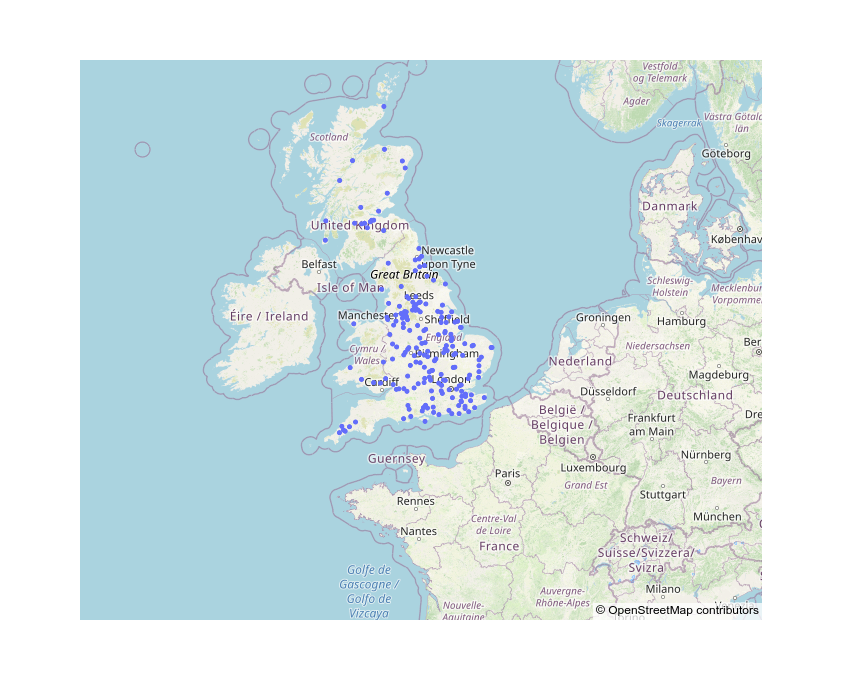

In [27]:
fig = px.scatter_mapbox(
    major_accidents,
    lat="latitude",
    lon="longitude",
    zoom=4,
#     mapbox_style="carto-positron",
    mapbox_style="open-street-map",
    hover_name='accident_index',
    hover_data={
        'latitude': False,
        'longitude': False,
        'major':False,
        'urban_or_rural_area': True,
        'number_of_casualties': True
    },
    width=600,
    height=700
)
fig.show()

This is a helpful map to better understand the density of major accidents. For instance, there seems to be a high concentration around Manchester and Leeds and very sparse major accidents in Scotland. To get a better understanding of the pattern in these accidents, let's color the data points by the `urban_or_rural_area` feature:

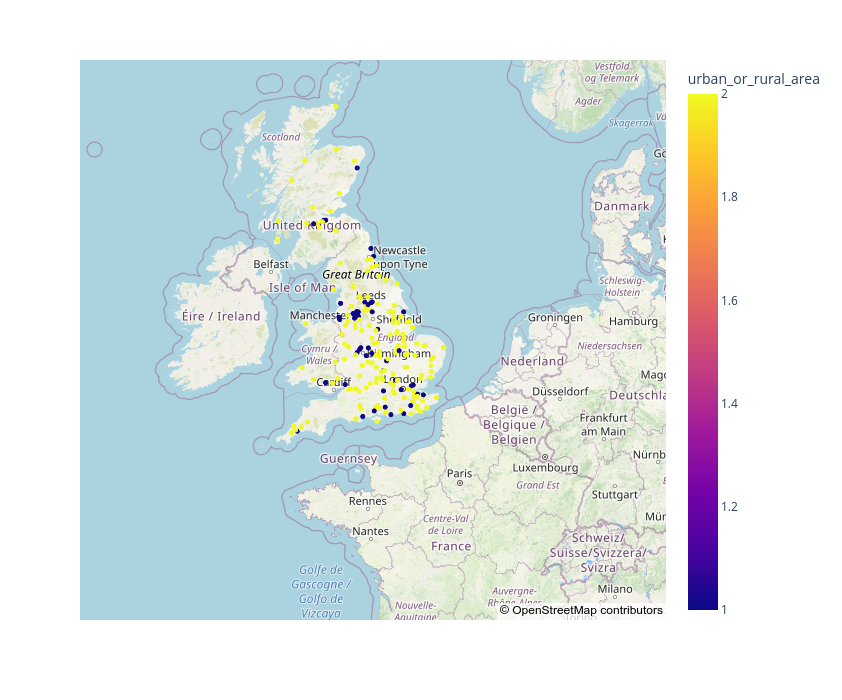

In [28]:
fig = px.scatter_mapbox(
    major_accidents,
    lat="latitude",
    lon="longitude",
    zoom=4,
    color = 'urban_or_rural_area',
#     mapbox_style="carto-positron",
    mapbox_style="open-street-map",
    hover_name='accident_index',
    hover_data={
        'latitude': False,
        'longitude': False,
        'major':False,
        'urban_or_rural_area': True,
        'number_of_casualties': True
    },
    width=600,
    height=700
)
fig.show()

From our first look at the map, we see that a majority of major accidents occur in **Rural areas** (feature `urban_or_rural_area` equal to 2 - see table bellow).

In [29]:
lookup_item('urban_or_rural_area')

,table,field name,code/format,label,note
125,Accident,urban_or_rural_area,1,Urban,field introduced in 1994
126,Accident,urban_or_rural_area,2,Rural,field introduced in 1994
127,Accident,urban_or_rural_area,3,Unallocated,field introduced in 1994
128,Accident,urban_or_rural_area,-1,Data missing or out of range,field introduced in 1994


Let's plot a simple bar plot to confirm this:

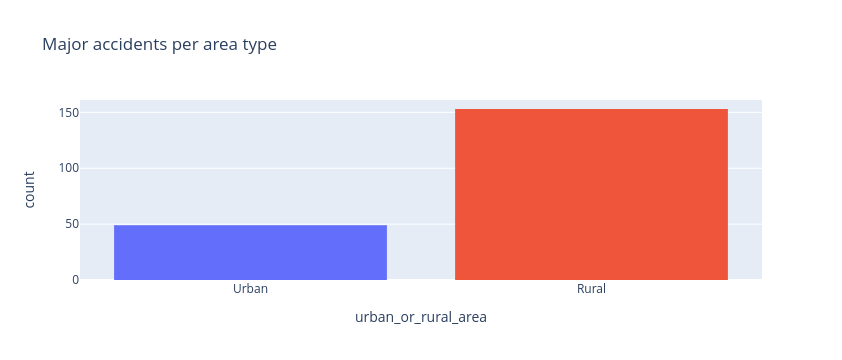

In [30]:
fig = px.histogram(major_accidents, x='urban_or_rural_area', color = 'urban_or_rural_area',
                   title='Major accidents per area type')
fig.update_layout(bargap=0.2)
fig.update_xaxes(
    ticktext=['Urban','Rural','Unallocated','Data missing'],
    tickvals=['1','2','3','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

Of all 202 major accidents in 2020, 153 of them happened in Rural areas. That's a little over 75% of major accidents. According to [gov.uk](https://www.gov.uk/government/collections/rural-urban-classification):

> The Classification defines areas as rural if they fall outside of settlements with more than 10,000 resident population.

**So major accidents in 2020, defined as fatal incidents involving 3+ casualties, tend to occur far from big centers.**

## What time of day and day of the week do most major incidents happen?

To answer this question, we'll explore some time-realted features and compare major to fatal and the totality of accidents. Doing this we can identify not only the patterns in major accidents but also the relative difference between other incidents.

To start, let's get the number of `fatal` accidents and create a dataframe holding only these:

In [31]:
print('Number of fatal accidents in 2020: ')
print( len(accidents_analysis[accidents_analysis['accident_severity']==1]) )

Number of fatal accidents in 2020: 
1391


In [32]:
# New dataframe holding fatal accidents
fatal_accidents = accidents_analysis[accidents_analysis['accident_severity']==1]

In [33]:
fatal_accidents.head(3)

,accident_index,accident_year,accident_reference,longitude,latitude,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,first_road_class,...,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,accident_month,accident_day,accident_day_of_year,accident_hour,major
15,2020010228038,2020,10228038,0.207510,51.593297,1,1,1,4,3,...,7,2,0,0,2,1,1,001,4,0
77,2020010228301,2020,10228301,-0.430454,51.441583,1,1,1,5,5,...,1,1,0,0,2,1,2,002,21,0
85,2020010228334,2020,10228334,-0.420010,51.548632,1,2,1,6,3,...,2,2,0,0,1,1,3,003,6,0


### Distribution of accidents on days of the week

As a first direct approach to the question in this section's title, let's see the number of major accidents across days of the week:

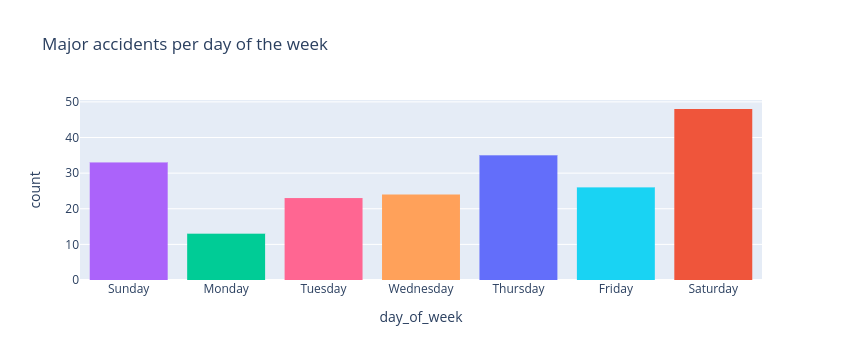

In [34]:
fig = px.histogram(major_accidents, x='day_of_week', color = 'day_of_week',
                   title='Major accidents per day of the week')
fig.update_layout(bargap=0.2)
fig.update_xaxes(
    ticktext=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],
    tickvals=['1','2','3','4','5','6','7'],
)
fig.update_layout(showlegend=False)
fig.show()

Let's compare this data with the ones for:
* Total accidents:

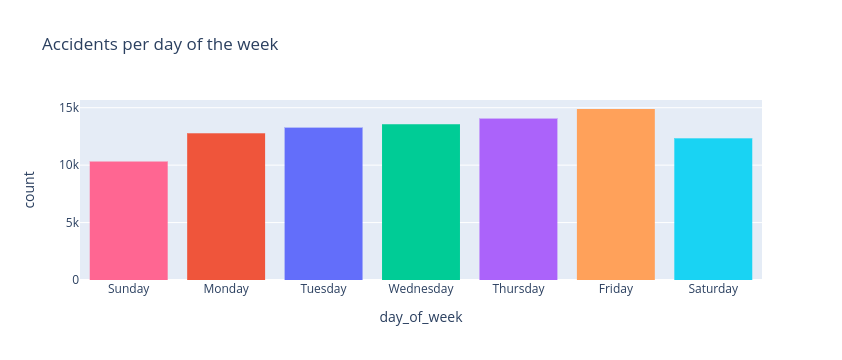

In [35]:
fig = px.histogram(accidents_analysis, x='day_of_week', color = 'day_of_week',
                   title='Accidents per day of the week')
fig.update_layout(bargap=0.2)
fig.update_xaxes(
    ticktext=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],
    tickvals=['1','2','3','4','5','6','7'],
)
fig.update_layout(showlegend=False)
fig.show()

* Fatal accidents:

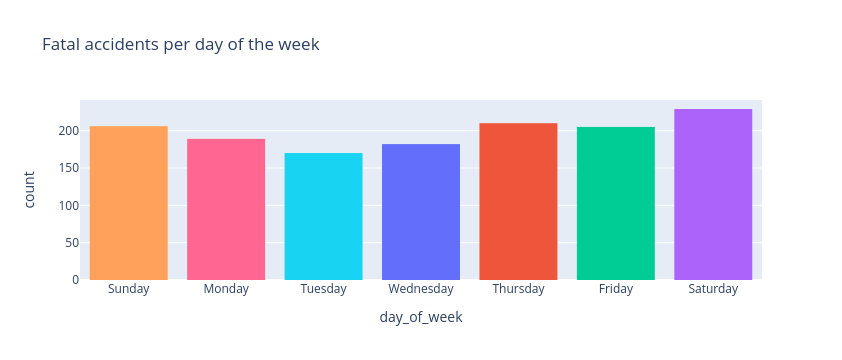

In [36]:
fig = px.histogram(fatal_accidents, x='day_of_week', color = 'day_of_week',
                   title='Fatal accidents per day of the week')
fig.update_layout(bargap=0.2)
fig.update_xaxes(
    ticktext=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],
    tickvals=['1','2','3','4','5','6','7'],
)
fig.update_layout(showlegend=False)
fig.show()

**Most major accidents happen on Saturdays**. However, when looking at the full data of accidents, Saturdays and Sundays have the least amount of accidents of all days of the week. Fatal accidents do happen more frequently on Saturdays, but the distribution is far more uniform among days than that of major accidents.

### Distribution of accidents by hour of day

We can repeat the process above for the hour of day and compare all three cases.

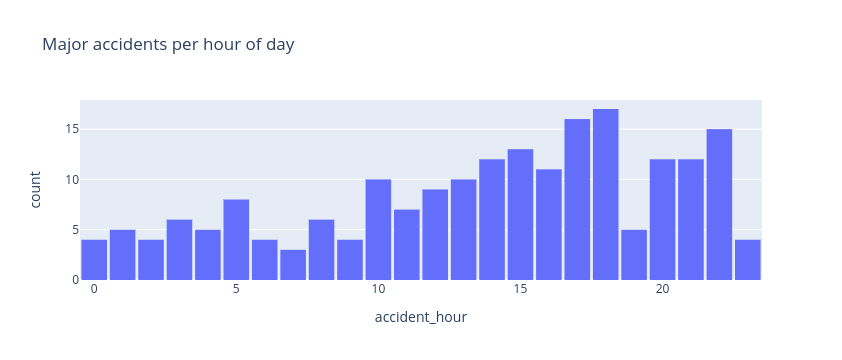

In [37]:
fig = px.histogram(major_accidents, x='accident_hour',
                   nbins=24,
                   title='Major accidents per hour of day')
fig.update_layout(bargap=0.1)
fig.show()

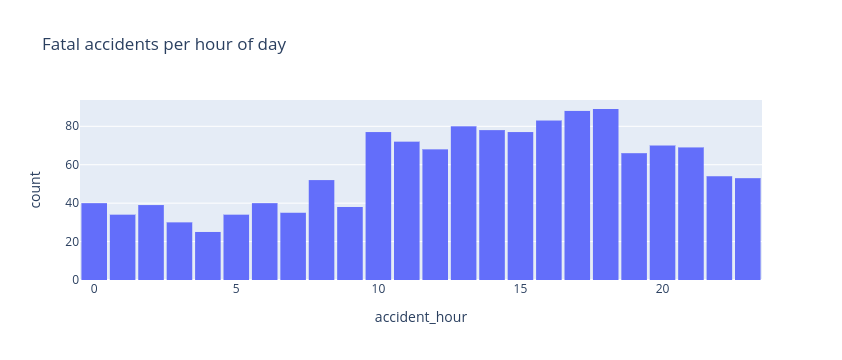

In [38]:
fig = px.histogram(fatal_accidents, x='accident_hour',
                   nbins=24,
                   title='Fatal accidents per hour of day')
fig.update_layout(bargap=0.1)
fig.show()

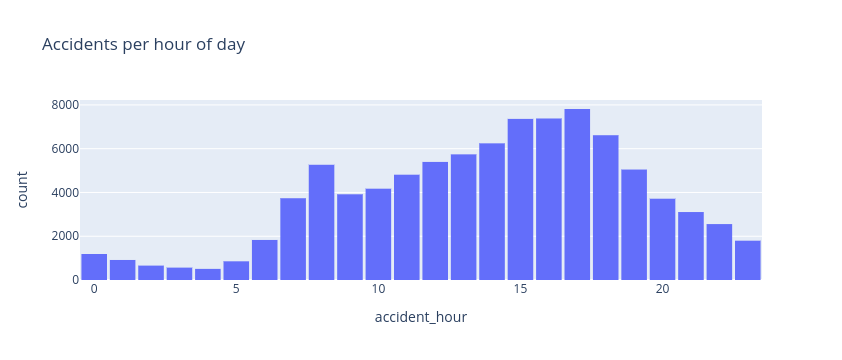

In [39]:
fig = px.histogram(accidents_analysis, x='accident_hour',
                   nbins=24,
                   title='Accidents per hour of day')
fig.update_layout(bargap=0.1)
fig.show()

Both fatal and major accidents occur more frequently at afternoons. Major accidents seem to increase with the hour after 10h with a big drop at 19h. Both major and fatal accidents have a high count at night, between 20h and 22h.

The total number of accidents does reach a big peak at 17h, dropping steadily until 4h (the next day). **This indicates a higher ratio of major to total accidents during the night period.**

To get a single interactive plot of fatal and major accidents we can use the `color` utility of the histogram plot of `plotly.express`:

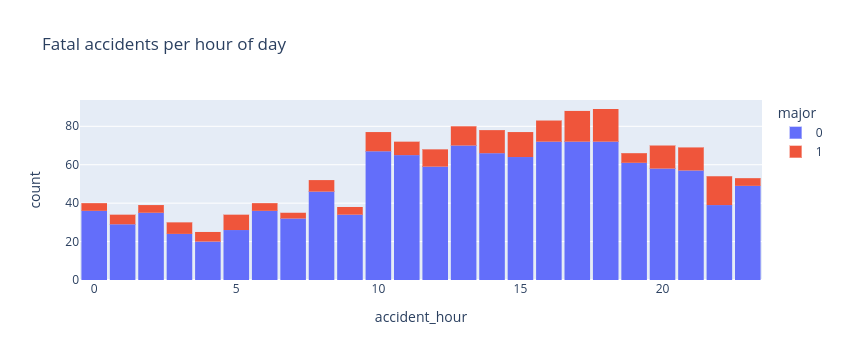

In [40]:
fig = px.histogram(fatal_accidents, x='accident_hour',
                   nbins=24,
                   color='major',
                   title='Fatal accidents per hour of day')
fig.update_layout(bargap=0.1)
fig.show()

In [41]:
# fig = px.histogram(accidents_analysis, x='accident_hour',
#                    nbins=24,
#                    facet_row='major',
#                    title='Accidents per hour of day',
#                    facet_row_spacing=0.2,
#                    height = 600)
# fig.update_layout(bargap=0.1)
# fig.update_yaxes(matches=None)
# fig.show()

In [42]:
# fig = px.histogram(accidents_analysis, x='accident_hour',
#                    nbins=24,
#                    facet_row='accident_severity',
#                    title='Accidents per hour of day',
#                    facet_row_spacing=0.2,
#                    height = 600)
# fig.update_layout(bargap=0.1)
# fig.update_yaxes(matches=None)
# fig.show()

### Ratio of major to total number of accidents

*Can we create a visual with the ratio of major to total accidents by hour?*

To get this (and some more information), we'll follow these steps:
* Group by `accident_hour` and `major`;
* Count the number of accidents in each group;
* Name the resulting dataframe as `accident_count`.

In [43]:
accidents_count = accidents_analysis.groupby(['accident_hour', 'major']).size().reset_index(name='counts')

In [44]:
accidents_count.tail(6)

,accident_hour,major,counts
42,21,0,3093
43,21,1,12
44,22,0,2540
45,22,1,15
46,23,0,1792
47,23,1,4


To get the ratio of major to total accidents per hour we'll do  trick using pandas `shift()` method. This method *shifts* the dataframe by a number of periods (read the docs [here](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.shift.html) ). The idea is to create a feature column named `major/total` where we divide the newly created `counts` column, which counts the number of major and non-major accidents per hour by the shifted column by ine period. Doing this, we'll always divide the row corresponding to the major accidents in a given hour by the corresponding number of total accidents. The rows corresponding to non-major accidents won't be relevant so we can drop of all them. We can do all these steps with the following code:

In [45]:
major_per_hour = accidents_count.copy()

major_per_hour['major/total'] = accidents_count['counts'] / accidents_count['counts'].shift(1)

major_per_hour = major_per_hour.drop(major_per_hour[major_per_hour['major']==0].index)

In [46]:
major_per_hour

,accident_hour,major,counts,major/total
1,0,1,4,0.003378
3,1,1,5,0.005495
5,2,1,4,0.006116
7,3,1,6,0.010714
9,4,1,5,0.009940
11,5,1,8,0.009456
13,6,1,4,0.002191
15,7,1,3,0.000804
17,8,1,6,0.001141
19,9,1,4,0.001022


Let's see the evolution of the number of major accidents by hour of day:

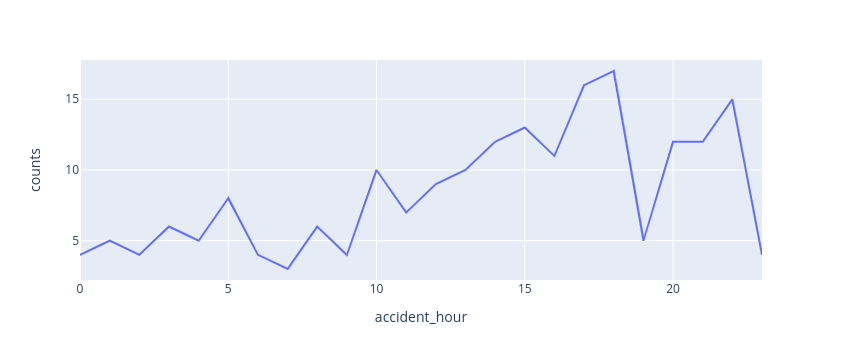

In [47]:
fig = px.line(major_per_hour, x = 'accident_hour', y='counts')
fig.update_layout(hovermode="x unified")
fig.show()

This is just a line representation of the previous histogram. Let's see the ratio:

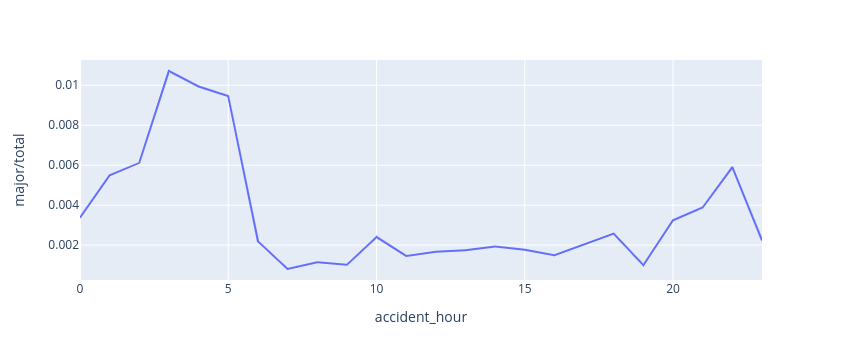

In [48]:
fig = px.line(major_per_hour, x = 'accident_hour', y='major/total')
fig.update_layout(hovermode="x unified")
fig.show()

Now we can clearly see that **major accidents occur with a much larger ratio to total ones between 22h and 5h**.

### Hourly evolution of accidents by severity

For completeness, we can repeat this idea of hourly evolution for the `accident_severity` feature:

In [49]:
accidents_severity_count = accidents_analysis.groupby(['accident_hour', 'accident_severity']).size().reset_index(name='counts')

In [50]:
accidents_severity_count

,accident_hour,accident_severity,counts
0,0,1,40
1,0,2,291
2,0,3,857
3,1,1,34
4,1,2,236
...,...,...,...
67,22,2,550
68,22,3,1951
69,23,1,53
70,23,2,408


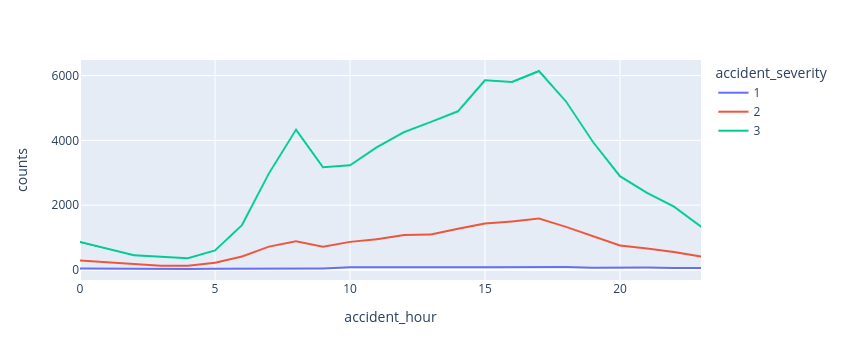

In [51]:
fig = px.line(accidents_severity_count, x = 'accident_hour', y='counts',
              color='accident_severity')
fig.update_layout(hovermode="x unified")
fig.show()

### Evolution of major to total accidents ratio by day of week

We can repeat the entire process of finding the ratio between major and total accidents filtering the results by day of the week. The idea is the same as before but we start with a groupby in the `day_of_week` feature.

In [52]:
accidents_dow = accidents_analysis.groupby(['day_of_week','accident_hour', 'major']).size().reset_index(name='counts')

In [53]:
accidents_dow.head()

,day_of_week,accident_hour,major,counts
0,1,0,0,306
1,1,1,0,223
2,1,1,1,3
3,1,2,0,170
4,1,3,0,142


In [54]:
dow_dict = {
    1:'Sunday',
    2:'Monday',
    3:'Tuesday',
    4:'Wednesday',
    5:'Thursday',
    6:'Friday',
    7:'Saturday'
}

Reusing the code from the previous sections, we can build a function to plot out the ratio evolution for a given day of the week:

In [55]:
def get_ratio_data(dow):
    '''
    Plots the evolution of major to total accidents for a given "dow" (day of week)
    '''
    major_ph = accidents_dow[accidents_dow['day_of_week']==dow]

    major_ph['major/total'] = major_ph['counts'] / major_ph['counts'].shift(1)

    major_ph = major_ph.drop(major_ph[major_ph['major']==0].index)
    
    fig = px.line(major_ph, x = 'accident_hour', y='major/total',
                 title = 'Major/total accidents ratio for '+dow_dict[dow])
    fig.update_layout(hovermode="x unified")
    fig.show() 

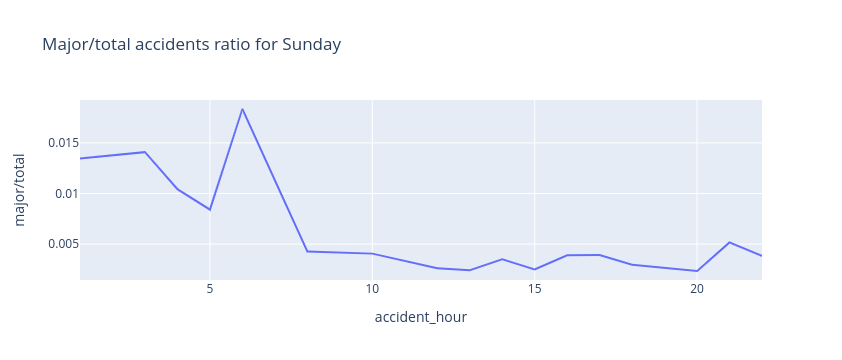

In [56]:
get_ratio_data(1)

Let's visualize all days of the week using a loop:

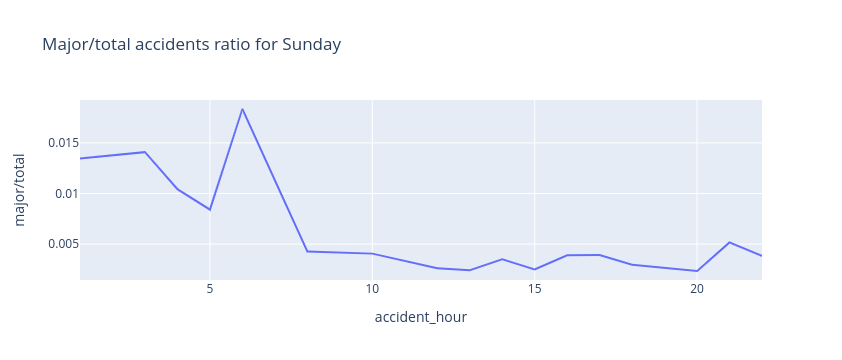

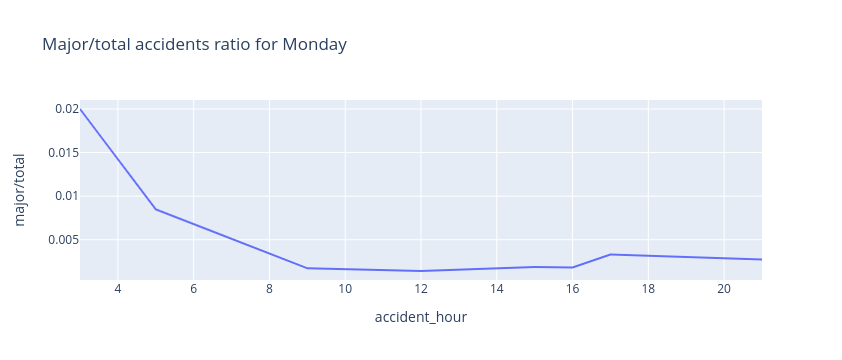

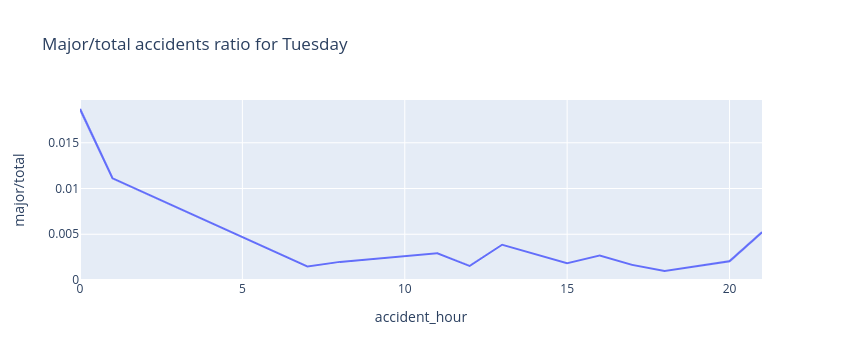

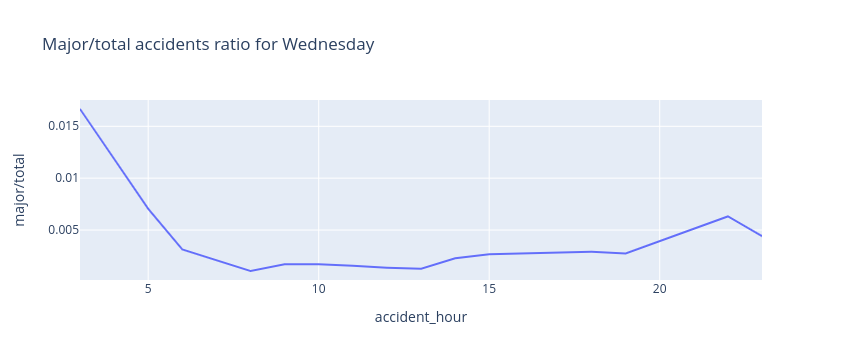

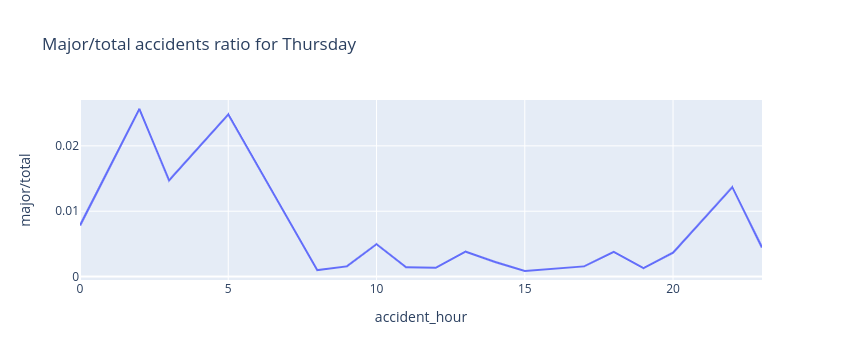

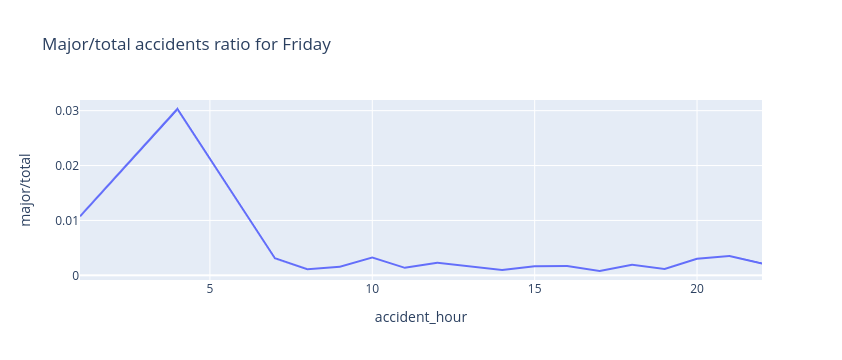

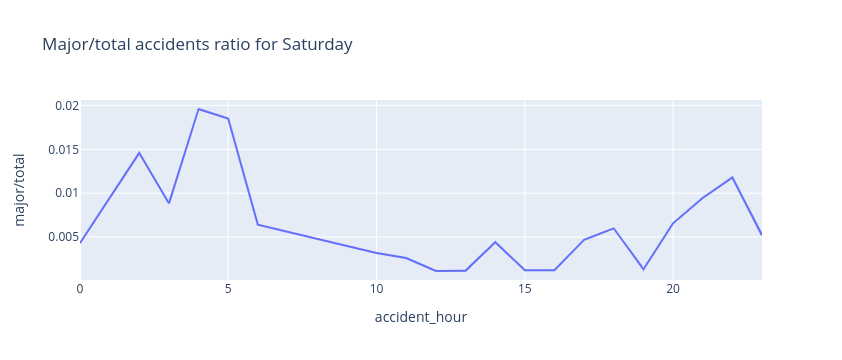

In [57]:
for i in range(1,8):
    get_ratio_data(i)

## Animated evolution:

### Per day of the year
*Can we see an animation with the evolution of major accidents per hour of the day along all days in a year?*

To start answering this question let's quickly groupby day of the year before the hour and binary `major` feature.

In [58]:
accidents_doy = accidents_analysis.groupby(['accident_day_of_year',
                                            'accident_hour', 'major']).size().reset_index(name='counts')

In [59]:
accidents_doy.head()

,accident_day_of_year,accident_hour,major,counts
0,001,0,0,14
1,001,1,0,12
2,001,2,0,14
3,001,3,0,13
4,001,3,1,1


In [60]:
accidents_doy['counts'].max()

57

The maximun number of accidents in a single day in 2020 was 57. 

The following animation shows the occurrence of major accidents throughout 2020. Each frame of the animation is a day and the appearing points represent the number of accidents (vertical line) in a given hour (horizontal line). Note that the maximun number of major accidents in a single ways was 2.

In [61]:
accidents_doy[accidents_doy['major']==1]['counts'].max()

2

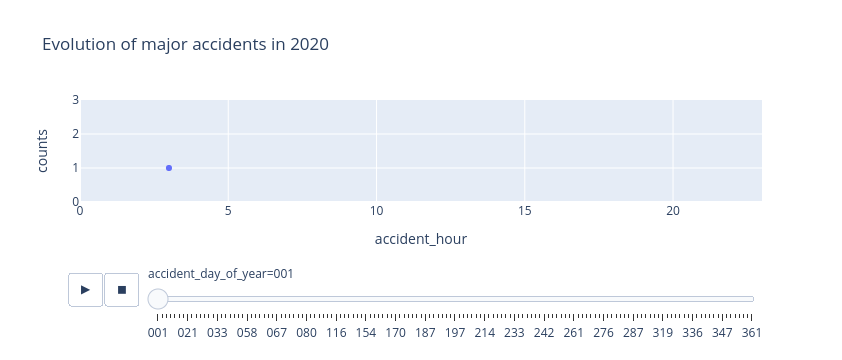

In [62]:
px.scatter(accidents_doy[accidents_doy['major']==1], x="accident_hour", y="counts",
           animation_frame="accident_day_of_year",
           animation_group="accident_hour",
           title='Evolution of major accidents in 2020',
           range_x=[0,23], range_y=[0,3])

We can repeat the process for the total number of accidents:

In [63]:
accidents_doy[accidents_doy['major']==0]['counts'].max()

57

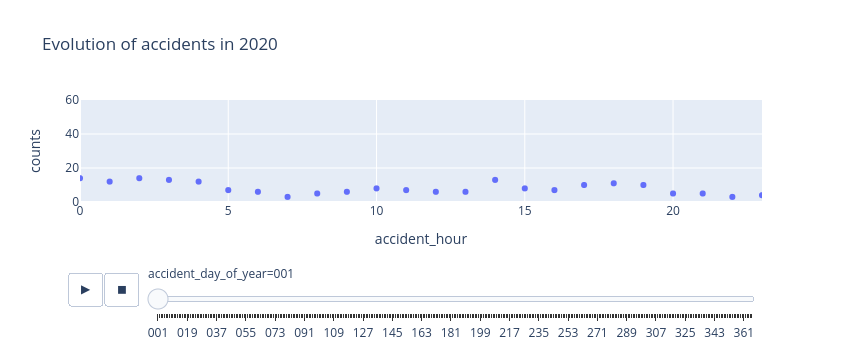

In [64]:
px.scatter(accidents_doy[accidents_doy['major']==0], x="accident_hour", y="counts",
           animation_frame="accident_day_of_year",
           animation_group="accident_hour",
           title='Evolution of accidents in 2020',
           range_x=[0,23], range_y=[0,60])

### Per month

Repeating everything but filtering the frame by month:

In [65]:
accidents_month = accidents_analysis.groupby(['accident_month',
                                              'accident_hour', 'major']).size().reset_index(name='counts')

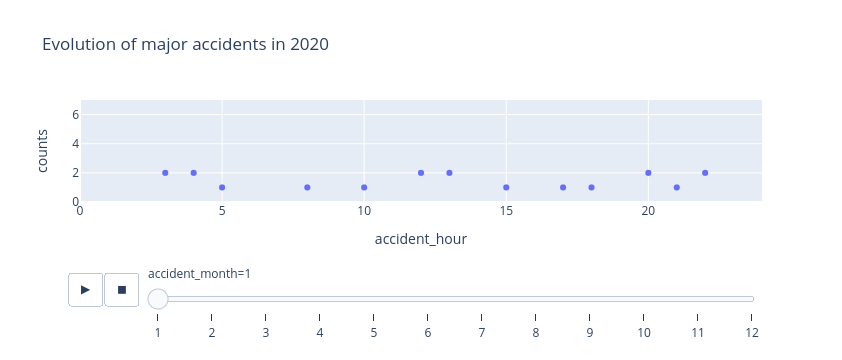

In [66]:
px.scatter(accidents_month[accidents_month['major']==1], x="accident_hour", y="counts",
           animation_frame="accident_month",
           animation_group="accident_hour",
           title='Evolution of major accidents in 2020',
           range_x=[0,24], range_y=[0,7])

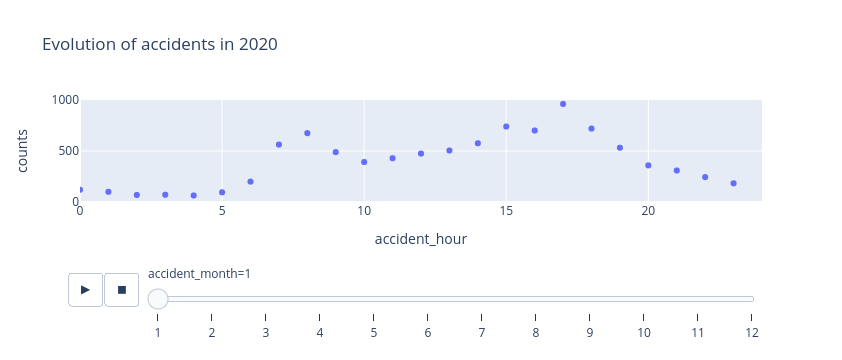

In [67]:
px.scatter(accidents_month[accidents_month['major']==0], x="accident_hour", y="counts",
           animation_frame="accident_month",
           animation_group="accident_hour",
           title='Evolution of accidents in 2020',
           range_x=[0,24], range_y=[0,1000])

We can see something really interesting here: if you follow [this](https://bfpg.co.uk/2020/04/covid-19-timeline/) timeline, you will find that major COVID-19 related lockdown policies started in the UK around the second half of March, 2020. As a **possible** result, we see in the previous animation a huge drop in the distribution of accidents count after March.

To better visualize if this observed pattern occurs in major accidents we can plot the count of accidents by month:

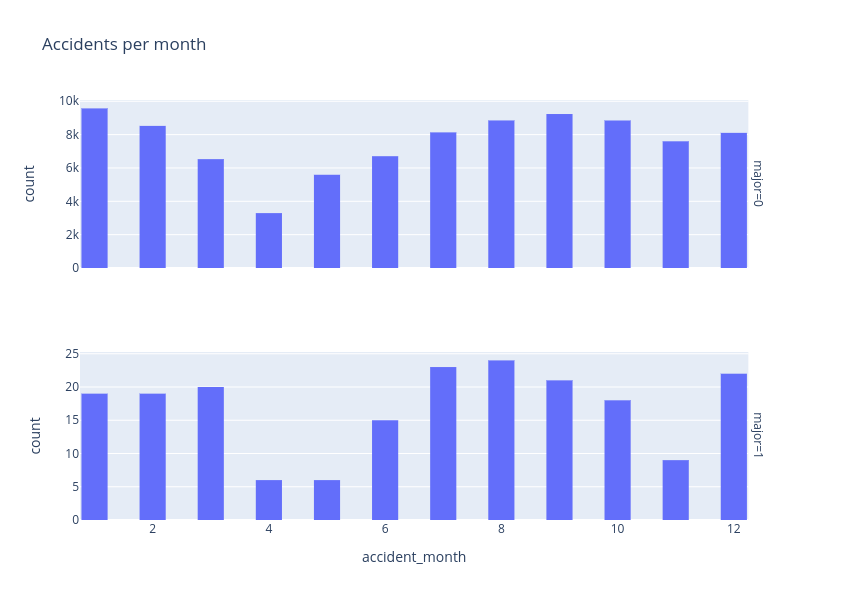

In [68]:
fig = px.histogram(accidents_analysis, x='accident_month',
                   nbins=24,
                   facet_row='major',
                   title='Accidents per month',
                   facet_row_spacing=0.2,
                   height = 600)
fig.update_layout(bargap=0.1)
fig.update_yaxes(matches=None)
fig.show()

Indeed the months of April and May have far fewer major (and total) accidents than the rest. Also, there is a big drop in major accidents in November.

### Per day of the week

Repeating everything but filtering the frame by day of the week:

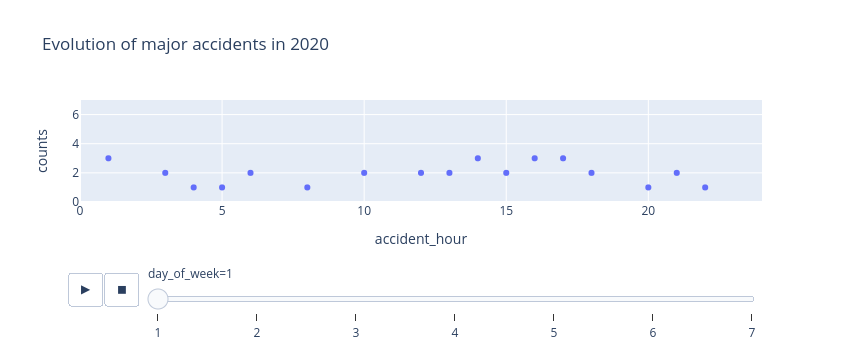

In [69]:
px.scatter(accidents_dow[accidents_dow['major']==1], x="accident_hour", y="counts",
           animation_frame="day_of_week",
           animation_group="accident_hour",
           title='Evolution of major accidents in 2020',
           range_x=[0,24], range_y=[0,7]).update_layout(hovermode="x unified")

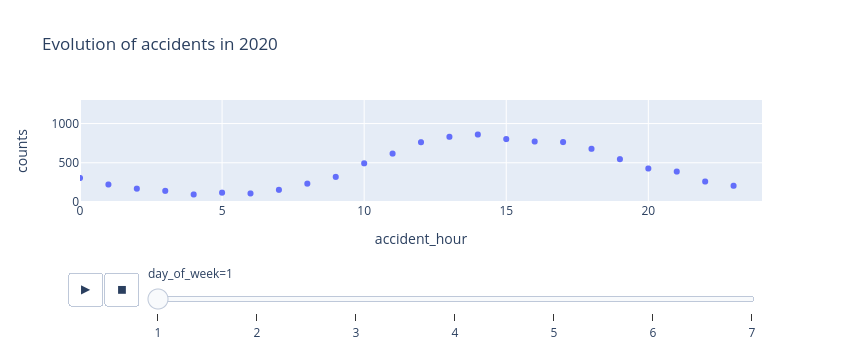

In [70]:
px.scatter(accidents_dow[accidents_dow['major']==0], x="accident_hour", y="counts",
           animation_frame="day_of_week",
           animation_group="accident_hour",
           title='Evolution of accidents in 2020',
           range_x=[0,24], range_y=[0,1300]).update_layout(hovermode="x unified")

It is interesting to see that, between Monday and Friday there is a pattern of peaks in the number of accidents around 8h and later around 17h. This peaks disappear in the weekends (as a possible reflex of the beginning and end of working hours).

## Distribution of accidents across different road types

We can explore the distribution of accidents in different road types with simple bar plots. To remember the different classes in this feature, let's see our `lookup_item` function:

In [71]:
lookup_item('road_type')

,table,field name,code/format,label,note
28,Accident,road_type,1,Roundabout,NaN
29,Accident,road_type,2,One way street,NaN
30,Accident,road_type,3,Dual carriageway,NaN
31,Accident,road_type,6,Single carriageway,NaN
32,Accident,road_type,7,Slip road,NaN
33,Accident,road_type,9,Unknown,NaN
34,Accident,road_type,12,One way street/Slip road,NaN
35,Accident,road_type,-1,Data missing or out of range,NaN


We can reuse some code to get our distribution across different road types for major, fatal and total accidents:

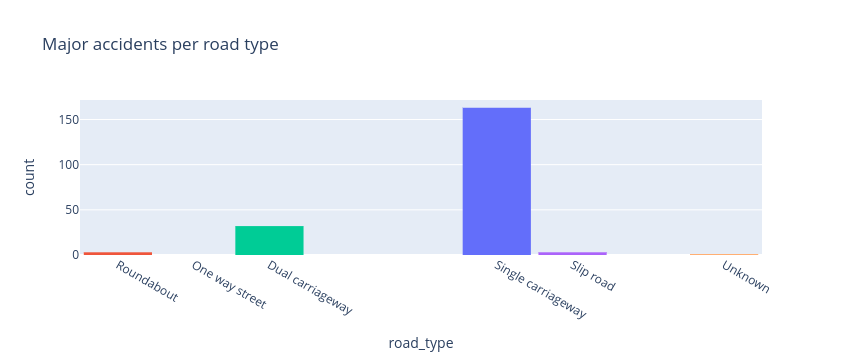

In [72]:
fig = px.histogram(major_accidents, x='road_type', color = 'road_type',
                   title='Major accidents per road type')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Roundabout','One way street','Dual carriageway',
              'Single carriageway','Slip road','Unknown',
              'One way street/Slip road', 'Data missing or out of range'],
    tickvals=['1','2','3','6','7','9','12','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

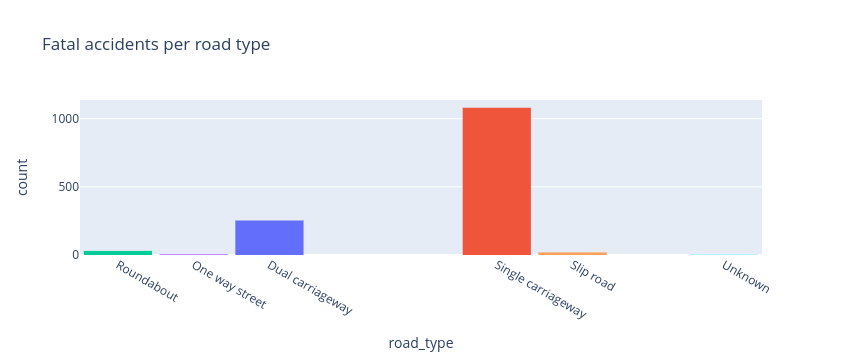

In [73]:
fig = px.histogram(fatal_accidents, x='road_type', color = 'road_type',
                   title='Fatal accidents per road type')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Roundabout','One way street','Dual carriageway',
              'Single carriageway','Slip road','Unknown',
              'One way street/Slip road', 'Data missing or out of range'],
    tickvals=['1','2','3','6','7','9','12','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

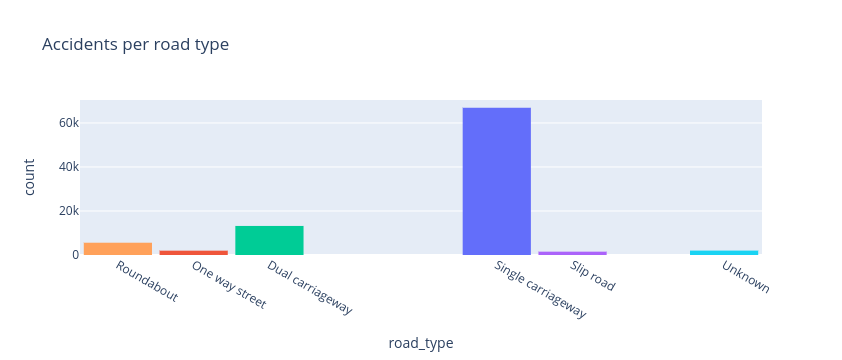

In [74]:
fig = px.histogram(accidents_analysis, x='road_type', color = 'road_type',
                   title='Accidents per road type')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Roundabout','One way street','Dual carriageway',
              'Single carriageway','Slip road','Unknown',
              'One way street/Slip road', 'Data missing or out of range'],
    tickvals=['1','2','3','6','7','9','12','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

All plots look very similar: the majority of accidents happen in *Single carriageway* roads. Following this, most accidents happen on *Dual carriageway* and on *Roundabouts*.

## Weather conditions

Now, to explore the weather conditions on which accidents happen. Let's use our `lookup_item` once more:

In [75]:
lookup_item('weather_conditions')

,table,field name,code/format,label,note
86,Accident,weather_conditions,1,Fine no high winds,NaN
87,Accident,weather_conditions,2,Raining no high winds,NaN
88,Accident,weather_conditions,3,Snowing no high winds,NaN
89,Accident,weather_conditions,4,Fine + high winds,NaN
90,Accident,weather_conditions,5,Raining + high winds,NaN
91,Accident,weather_conditions,6,Snowing + high winds,NaN
92,Accident,weather_conditions,7,Fog or mist,NaN
93,Accident,weather_conditions,8,Other,NaN
94,Accident,weather_conditions,9,Unknown,NaN
95,Accident,weather_conditions,-1,Data missing or out of range,NaN


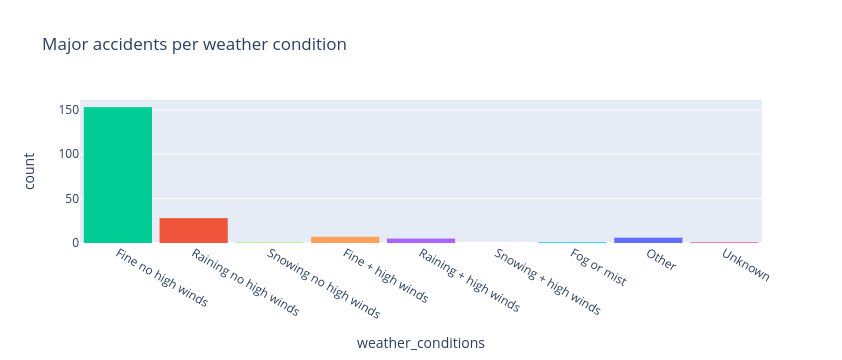

In [76]:
fig = px.histogram(major_accidents, x='weather_conditions', color = 'weather_conditions',
                   title='Major accidents per weather condition')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Fine no high winds','Raining no high winds','Snowing no high winds',
              'Fine + high winds','Raining + high winds','Snowing + high winds',
              'Fog or mist', 'Other', 'Unknown', 'Data missing or out of range'],
    tickvals=['1','2','3','4','5','6','7','8','9','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

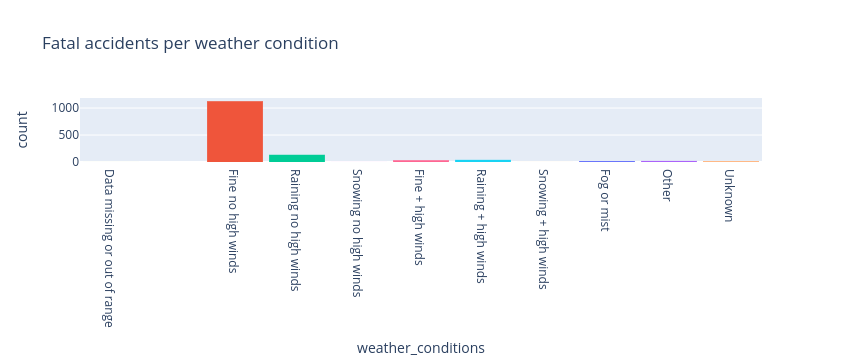

In [77]:
fig = px.histogram(fatal_accidents, x='weather_conditions', color = 'weather_conditions',
                   title='Fatal accidents per weather condition')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Fine no high winds','Raining no high winds','Snowing no high winds',
              'Fine + high winds','Raining + high winds','Snowing + high winds',
              'Fog or mist', 'Other', 'Unknown', 'Data missing or out of range'],
    tickvals=['1','2','3','4','5','6','7','8','9','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

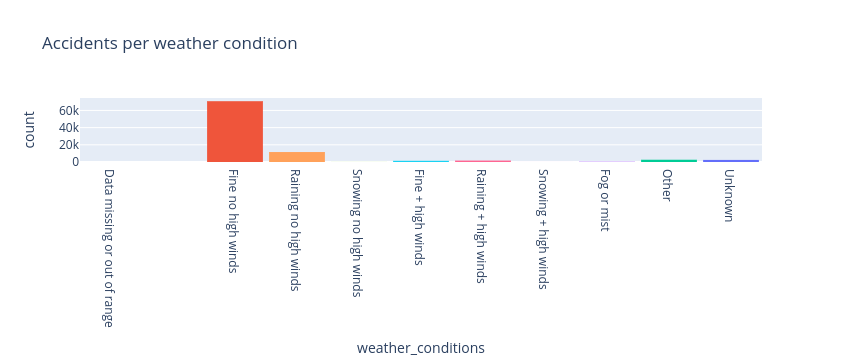

In [78]:
fig = px.histogram(accidents_analysis, x='weather_conditions', color = 'weather_conditions',
                   title='Accidents per weather condition')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Fine no high winds','Raining no high winds','Snowing no high winds',
              'Fine + high winds','Raining + high winds','Snowing + high winds',
              'Fog or mist', 'Other', 'Unknown', 'Data missing or out of range'],
    tickvals=['1','2','3','4','5','6','7','8','9','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

Again, no big differences between this three plots: most accidents happen on fine weather with no high winds.

## Speed limits

Now, we can explore the distribuion of accidents according to the speed limit of the road where they happen. Using our trusty `lookup_item`, let's refresh the possible entries:

In [79]:
lookup_item('speed_limit')

,table,field name,code/format,label,note
36,Accident,speed_limit,NaN,NaN,"20,30,40,50,60,70 are the only valid speed limits on public highways"
37,Accident,speed_limit,-1,Data missing or out of range,NaN
38,Accident,speed_limit,99,unknown (self reported),NaN


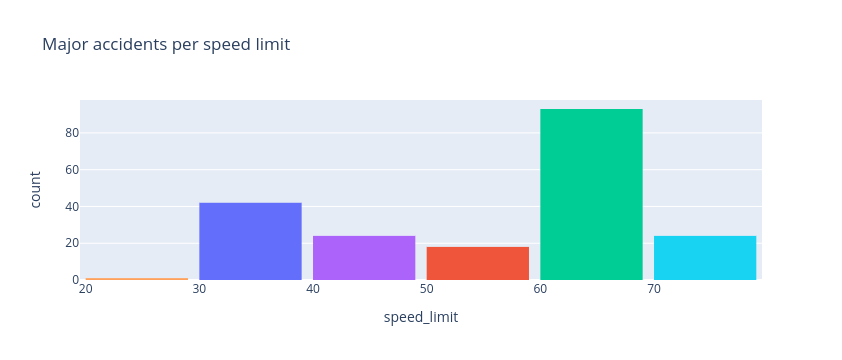

In [80]:
fig = px.histogram(major_accidents, x='speed_limit', color = 'speed_limit',
                   title='Major accidents per speed limit')
fig.update_layout(bargap=0.1)
fig.update_layout(showlegend=False)
fig.show()

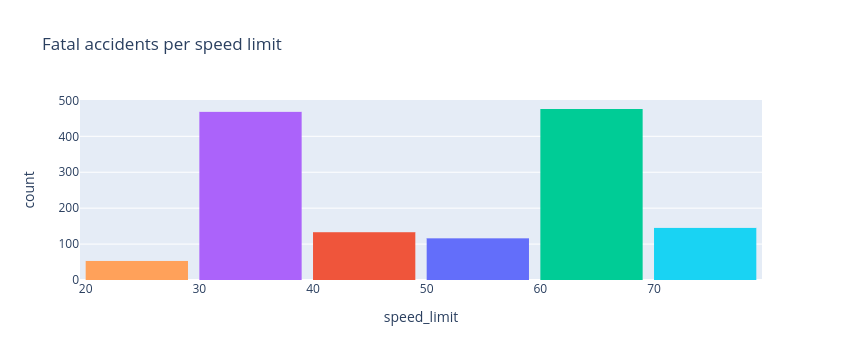

In [81]:
fig = px.histogram(fatal_accidents, x='speed_limit', color = 'speed_limit',
                   title='Fatal accidents per speed limit')
fig.update_layout(bargap=0.1)
fig.update_layout(showlegend=False)
fig.show()

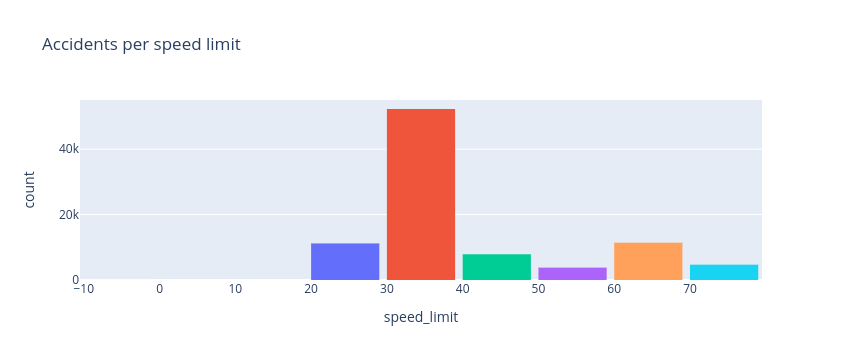

In [82]:
fig = px.histogram(accidents_analysis, x='speed_limit', color = 'speed_limit',
                   title='Accidents per speed limit')
fig.update_layout(bargap=0.1)
fig.update_layout(showlegend=False)
fig.show()

In the Uk,
> The national speed limit is 70 mph (113 kilometres per hour) (km/h) on motorways, 70 mph (113 km/h) on dual carriageways, 60 mph (97 km/h) on single carriageways and generally 30 mph (48 km/h) in areas with street lighting (Built-up area) **(From [Wikipedia](https://en.wikipedia.org/wiki/Road_speed_limits_in_the_United_Kingdom))**

From our data:
* Major accidents: mostly happened (in 2020) on roads with a speed limit of 60 mph (a little over 46% of them). 
* Fatal accidents: mostly happen (in 2020) on roads with a speed limit of 30 or 60 mph (over 67% of them)
* Total accidents: mostly happen (in 2020) on roads with a speed limit of 30 (over 57% of them)

## Number of casualties

Let's explore the distribution of the number of casualties in accidents from 2020. To start, we can get a simple table for the distribution of the number of casualties in major, fatal and total accidents.

In [83]:
major_accidents['number_of_casualties'].value_counts()

3     123
4      46
5      20
6       9
8       2
11      1
19      1
Name: number_of_casualties, dtype: int64

In [84]:
fatal_accidents['number_of_casualties'].value_counts()

1     956
2     233
3     123
4      46
5      20
6       9
8       2
11      1
19      1
Name: number_of_casualties, dtype: int64

In [85]:
accidents_analysis['number_of_casualties'].value_counts()

1     74150
2     12218
3      3214
4      1063
5       349
6       115
7        43
8        14
9         7
11        4
10        3
12        1
13        1
17        1
19        1
41        1
Name: number_of_casualties, dtype: int64

There is one accident with 41 casualties! Let's inspect it a bit:

In [89]:
accidents_analysis[accidents_analysis['number_of_casualties']==41]

,accident_index,accident_year,accident_reference,longitude,latitude,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,first_road_class,...,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,accident_month,accident_day,accident_day_of_year,accident_hour,major
66993,2020440349165,2020,440349165,-1.314431,51.085841,2,1,41,5,6,...,1,1,0,0,2,9,10,254,8,0


It is considered a *serious* accident and happened at 8h in the 10th of september.

The total number of casualties in 2020 is 115.584. However, to fully interpret this number, I advise the reader to take a look at the [offical report](https://www.gov.uk/government/statistics/reported-road-casualties-great-britain-annual-report-2020/reported-road-casualties-great-britain-annual-report-2020) on road casualties from the government of the UK. To quote:

> There were a total of 115,584 casualties of all severities in reported road traffic accidents in 2020, 25% lower than in 2019.

>This figure should be interpreted with caution for two reasons:

>* It has long been known that non-fatal (and particularly slight) casualties are underreported to the police and therefore this figure is likely to be an underestimate of the total. The introduction of online self-reporting by the Metropolitan Police Service at the end of 2016 and a few other forces in 2018 may have affected the number of non-fatal casualties reported in these forces and therefore impact the total for Great Britain. See our analysis of the impact of online self-reporting for more details.

>* While the total number of injuries is likely to be an underestimate, we have no reason to believe that the level of under-reporting has changed over time so that the trends shown for 2020 are likely to reflect a genuine fall in the number of casualties. Comparisons to other available data sources are available in our coherence of sources of road accidents data report.

In [93]:
accidents['number_of_casualties'].sum()

115584

## Light conditions

Let's get our simple table and the `lookup_item` function to remeber the entries in this feature:

In [102]:
accidents_analysis['light_conditions'].value_counts()

 1    64448
 4    19025
 6     4834
 7     2192
 5      685
-1        1
Name: light_conditions, dtype: int64

In [103]:
lookup_item('light_conditions')

,table,field name,code/format,label,note
80,Accident,light_conditions,1,Daylight,NaN
81,Accident,light_conditions,4,Darkness - lights lit,NaN
82,Accident,light_conditions,5,Darkness - lights unlit,NaN
83,Accident,light_conditions,6,Darkness - no lighting,NaN
84,Accident,light_conditions,7,Darkness - lighting unknown,NaN
85,Accident,light_conditions,-1,Data missing or out of range,NaN


In [115]:
major_accidents['light_conditions'].value_counts()

1    121
6     45
4     34
5      2
Name: light_conditions, dtype: int64

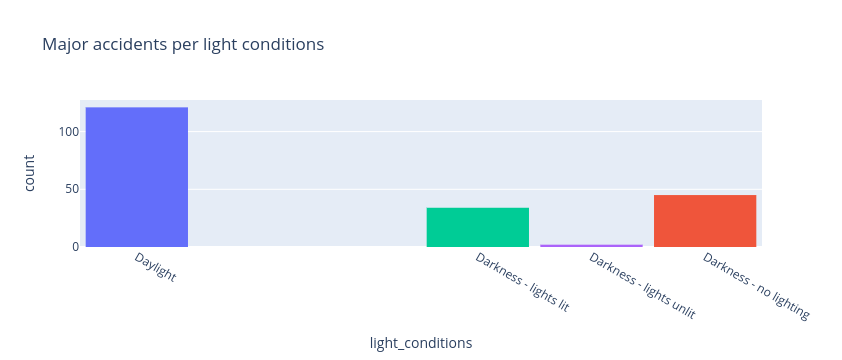

In [117]:
fig = px.histogram(major_accidents, x='light_conditions', color = 'light_conditions',
                   title='Major accidents per light conditions')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Daylight','Darkness - lights lit','Darkness - lights unlit',
              'Darkness - no lighting','Darkness - lighting unknown','Data missing or out of range'],
    tickvals=['1','4','5','6','7','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

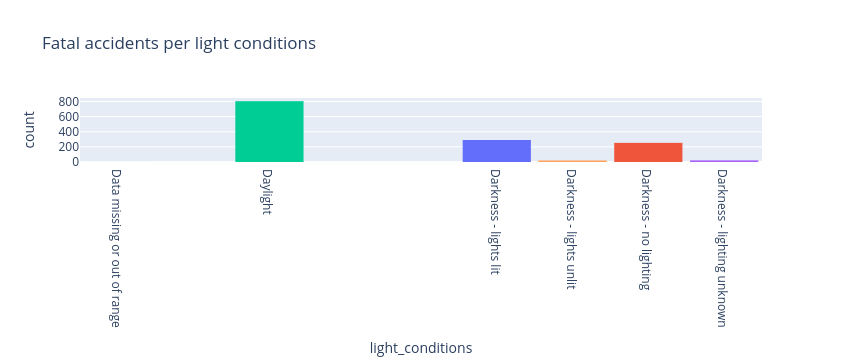

In [118]:
fig = px.histogram(fatal_accidents, x='light_conditions', color = 'light_conditions',
                   title='Fatal accidents per light conditions')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Daylight','Darkness - lights lit','Darkness - lights unlit',
              'Darkness - no lighting','Darkness - lighting unknown','Data missing or out of range'],
    tickvals=['1','4','5','6','7','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

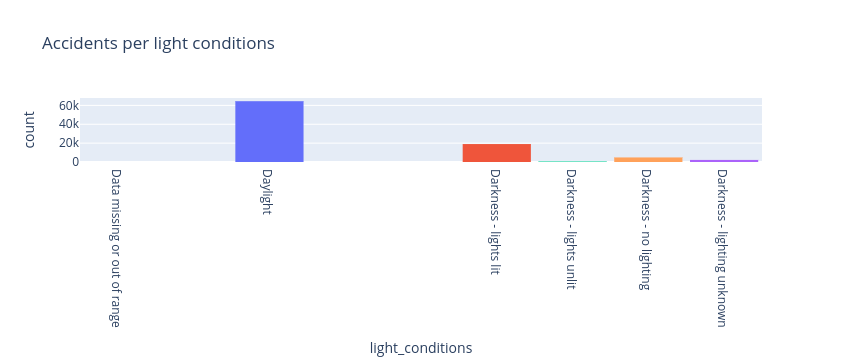

In [119]:
fig = px.histogram(accidents_analysis, x='light_conditions', color = 'light_conditions',
                   title='Accidents per light conditions')
fig.update_layout(bargap=0.1)
fig.update_xaxes(
    ticktext=['Daylight','Darkness - lights lit','Darkness - lights unlit',
              'Darkness - no lighting','Darkness - lighting unknown','Data missing or out of range'],
    tickvals=['1','4','5','6','7','-1'],
)
fig.update_layout(showlegend=False)
fig.show()

What can we tell:
* Major accidents: most happen during Daylight (over 59%).
* Fatal accidents: most happen during Daylight (over 57%).
* Major accidents: most happen during Daylight (over 70%).

Among these 3 plots, the one for *major* accidents is the only one that has more accidents happening in `Darkness - no lighting` (45) than on `Darkness - lights lit` (34). It is not by a considerable amount, but enough to cacth our attention.

# 💭 Conclusions and recommendations

The year of 2020 was an uncommon one for all of us. With the impact of the COVID-19 pandemic, restrictions were (rightfully!) implemented early in the year, completely changing the scenario for urban mobility. To see some numbers, we can quote the [offical report](https://www.gov.uk/government/statistics/reported-road-casualties-great-britain-annual-report-2020/reported-road-casualties-great-britain-annual-report-2020) once again:

>* an estimated 1,460 reported road deaths in 2020 which includes a total of 4 months of national lockdown (April to June and November)
>* an estimated 23,529 killed or seriously injured (KSI) casualties in 2020, a decrease of 22% compared to the same period in 2019
>* 115,584 casualties of all severities in 2020, down by 25% from 2019
>* the reduction in road traffic followed a similar trend in the same period and decreased by 21%
>* pedal cyclist casualty rates per billion vehicle miles saw the greatest percentage decrease (34%) compared to all other road user types

Given this scenario, we have analyzed the road safety data and conclude this report with the following main considerations and recommendations.

## Main considerations

* Major accidents in 2020, defined as fatal incidents involving 3+ casualties, tend to occur far from big centers. **Over 75% of major accidents happened in rural areas**;

* **Most major accidents happen on Saturdays**. However, when looking at the full data of accidents, Saturdays and Sundays have the least amount of accidents of all days of the week. Fatal accidents do happen more frequently on Saturdays, but the distribution is far more uniform among days than that of major accidents;

* **Both fatal and major accidents occur more frequently at afternoons**. Major accidents seem to increase with the hour after 10h with a big drop at 19h. Both major and fatal accidents have a high count at night, between 20h and 22h;

* The total number of accidents does reach a big peak at 17h, dropping steadily until 4h (the next day). **This indicates a higher ratio of major to total accidents during the night period**;

* **Major accidents occur with a much larger ratio to total ones between 22h and 5h**;

* Between Monday and Friday there is a pattern of peaks in the number of accidents around 8h and later around 17h. This peaks disappear in the weekends (as a possible reflex of the beginning and end of working hours);

* **Majority of accidents happen in *Single carriageway* roads**. Following this, most accidents happen on *Dual carriageway* and on *Roundabouts*;

* **Major accidents mostly happened on roads with a speed limit of 60 mph** (a little over 46% of them);
* Fatal accidents mostly happen on roads with a speed limit of 30 or 60 mph (over 67% of them);
* Total accidents mostly happen on roads with a speed limit of 30 (over 57% of them);

* **Major accidents mostly happen during Daylight** (over 59%);
* Fatal accidents mostly happen during Daylight (over 57%);
* Major accidents mostly happen during Daylight (over 70%).

## Recommendations

* To reduce major incidents, we recommend paying close attention to traffic on rural areas, where over 75% of major accidents occurr.

* Monitor and possibly create awareness for road safety on weekends and the start/end of work day.

